#  6.13 Lab: Data exploration
<span style="color:#e2c382;">*Jayden LI*</span>
---

<a id="learning-objectives"></a>
## Learning Objectives
*After completing this lab, you will be able to:*

- Explore and interrogate different data sets using our pandas and Plotly skills.
- Interpret the findings to understand what the data tells us about the real world.

## Contents:
* [Analysing sneaker resale data](#sneakers)
* [Covid API](#covid)


<a id="sneakers"></a>

# <font color='blue'> Sneaker resale data</font>

In this Lab we'll be working with two datasets. 
    
The first consists of sneaker sales, collected from the sneaker website [Stock X](https://stockx.com/) and made available on [Kaggle](https://www.kaggle.com/hudsonstuck/stockx-data-contest?select=StockX-Data-Contest-2019-3.csv).

The data consists of a random sample of all Off-White x Nike and Yeezy 350 sales from between 9/1/2017 (the month that Off-White first debuted “The Ten” collection) and 2019.

There are 99,956 total sales in the data set; 27,794 Off-White sales, and 72,162 Yeezy sales. The sample consists of U.S. sales only.

Our task is to answer 3 questions:
1. **Which sneakers achieve the highest resale values?**
2. **Are particular brands or sizes likely to sell for more?**
3. **What’s the average profit per sale?**

<br />

Let's start by reading in the data as a pandas `DataFrame` called `sneakers_df`. 

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import requests

In [22]:
sneakers_df = pd.read_csv('StockX_Data_2019.csv')

Now preview the first 5 rows of the data.

In [23]:
sneakers_df.head(5)

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region
0,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-Low-V2-Beluga,"$1,097",$220,9/24/16,11.0,California
1,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Copper,$685,$220,11/23/16,11.0,California
2,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Green,$690,$220,11/23/16,11.0,California
3,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red,"$1,075",$220,11/23/16,11.5,Kentucky
4,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Red-2017,$828,$220,2/11/17,11.0,Rhode Island


How many rows and columns does the dataset have?

In [24]:
sneakers_df.shape

(99956, 8)

Check the type of data in each column- do you notice any problems?

In [25]:
# The prices are in oject type.

sneakers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99956 entries, 0 to 99955
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Order Date    99956 non-null  object 
 1   Brand         99956 non-null  object 
 2   Sneaker Name  99956 non-null  object 
 3   Sale Price    99956 non-null  object 
 4   Retail Price  99956 non-null  object 
 5   Release Date  99956 non-null  object 
 6   Shoe Size     99956 non-null  float64
 7   Buyer Region  99956 non-null  object 
dtypes: float64(1), object(7)
memory usage: 6.1+ MB


Let's start to clean up our dataset and answer the questions in our analysis.

US shoe size are 0.5 larger than UK shoe sizes. Can you convert the existing shoe sizes into UK size, and create a new column in the `DataFrame` called `Shoe Size UK` which holds the new values?

In [26]:
sneakers_df['Shoe Size UK'] = sneakers_df['Shoe Size']-0.5

You might have noticed earlier when running the `dtypes` command that the `Retail Price` and `Sale Price` columns are currently being treated like strings. We need to convert them into numeric columns so we can calculate factors like profit. 

Start by removing the dollar sign in both of these columns (hint: you can use `str.replace` and replace the dollar symbol with `''`. You will also need to overwrite the original columns in your dataset with the new ones using syntax similar to this: `df[column_name] = df[column_name]*100`.)

In [27]:
sneakers_df['Sale Price'] = sneakers_df['Sale Price'].str.replace('$','')
sneakers_df['Retail Price'] = sneakers_df['Retail Price'].str.replace('$','')

C:\Users\user\AppData\Local\Temp\ipykernel_4716\426815994.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  sneakers_df['Sale Price'] = sneakers_df['Sale Price'].str.replace('$','')
C:\Users\user\AppData\Local\Temp\ipykernel_4716\426815994.py:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  sneakers_df['Retail Price'] = sneakers_df['Retail Price'].str.replace('$','')


In [28]:
sneakers_df.head(3)

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Shoe Size UK
0,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-Low-V2-Beluga,"1,097",220,9/24/16,11.0,California,10.5
1,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Copper,685,220,11/23/16,11.0,California,10.5
2,9/1/17,Yeezy,Adidas-Yeezy-Boost-350-V2-Core-Black-Green,690,220,11/23/16,11.0,California,10.5


Now, try running this `pd.to_numeric` function to convert both of these columns into numeric ones:

In [29]:
sneakers_df['Sale Price'] = pd.to_numeric(sneakers_df['Sale Price'])
sneakers_df['Retail Price'] = pd.to_numeric(sneakers_df['Retail Price'])

ValueError: Unable to parse string "1,097" at position 0

It looks like we've hit an error! What does the error message say? Can you figure out what's going wrong?

We need to remove the commas (`,`) in both of these columns before we can convert them to numbers. Do this now:

In [30]:
sneakers_df['Sale Price'] = sneakers_df['Sale Price'].str.replace(',','')
sneakers_df['Retail Price'] = sneakers_df['Retail Price'].str.replace(',','')

Now let's try converting them to numeric columns again:

In [31]:
sneakers_df['Sale Price'] = pd.to_numeric(sneakers_df['Sale Price'])
sneakers_df['Retail Price'] = pd.to_numeric(sneakers_df['Retail Price'])

Can you now create a new column called `Profit` which shows the difference between the sale price and retail price?

In [32]:
sneakers_df['profit'] = sneakers_df['Sale Price'] - sneakers_df['Retail Price']

Find the highest sale price in the dataset, and the largest amount of profit.

In [33]:
# Highest sale price

sneakers_df['Sale Price'].max()

4050

In [34]:
# Largest amount of profit
max(sneakers_df['profit'])

3860

The largest profit is huge...but it's obviously not representative of how much profit is made on each sneaker sale on average. 

Find the **mean profit per sale.**

In [35]:
sneakers_df['profit'].mean()

238.02112929689062

The `describe()` method is a handy way of accessing summary statistics for an entire `DataFrame` in one go. Try running it on your `DataFrame`:

In [36]:
sneakers_df.describe()

,Sale Price,Retail Price,Shoe Size,Shoe Size UK,profit
count,99956.000000,99956.00000,99956.000000,99956.000000,99956.000000
mean,446.634719,208.61359,9.344181,8.844181,238.021129
std,255.982969,25.20001,2.329588,2.329588,266.133179
min,186.000000,130.00000,3.500000,3.000000,-34.000000
25%,275.000000,220.00000,8.000000,7.500000,58.000000
50%,370.000000,220.00000,9.500000,9.000000,154.000000
75%,540.000000,220.00000,11.000000,10.500000,342.000000
max,4050.000000,250.00000,17.000000,16.500000,3860.000000


Now, let's start filtering our data by writing logical tests. How many sneakers sold for above the **mean** sale price?

In [37]:
sneakers_df[sneakers_df['Sale Price'] > sneakers_df['Sale Price'].mean()].shape

(33109, 10)

Create a new column called `Profit Ratio` which shows the ratio between the `Sale Price` and `Retail Price`.

How many sneakers sold for more than 2 times their retail price?

In [38]:
sneakers_df['Profit Ratio'] = sneakers_df['Sale Price'] / sneakers_df['Retail Price']

sneakers_df[sneakers_df['Profit Ratio'] > 2].shape

(35436, 11)

How many sneakers in the dataset are red? You'll have to think creatively about where color information is stored in the dataset, and how to extract it.

In [39]:
sneakers_df[sneakers_df['Sneaker Name'].str.lower().str.contains('red')].shape

(1271, 11)

Sort the dataset in ascending order of profit, to find the sneaker name that sold for the highest profit.

In [40]:
sneakers_df.sort_values(by=['profit'], ascending= False)

,Order Date,Brand,Sneaker Name,Sale Price,Retail Price,Release Date,Shoe Size,Buyer Region,Shoe Size UK,profit,Profit Ratio
26870,5/26/18,Off-White,Air-Jordan-1-Retro-High-Off-White-Chicago,4050,190,9/9/17,6.0,Wisconsin,5.5,3860,21.315789
43410,8/10/18,Off-White,Air-Jordan-1-Retro-High-Off-White-Chicago,3700,190,9/9/17,6.5,New York,6.0,3510,19.473684
25935,5/16/18,Off-White,Air-Jordan-1-Retro-High-Off-White-University-Blue,3680,190,6/23/18,9.5,New Jersey,9.0,3490,19.368421
47061,8/30/18,Off-White,Air-Jordan-1-Retro-High-Off-White-Chicago,3500,190,9/9/17,6.5,New York,6.0,3310,18.421053
95189,2/3/19,Off-White,Air-Jordan-1-Retro-High-Off-White-Chicago,3400,190,9/9/17,7.0,California,6.5,3210,17.894737
...,...,...,...,...,...,...,...,...,...,...,...
58231,11/1/18,Yeezy,adidas-Yeezy-Boost-350-V2-Butter,195,220,6/30/18,9.0,Colorado,8.5,-25,0.886364
87770,1/9/19,Yeezy,adidas-Yeezy-Boost-350-V2-Butter,194,220,6/30/18,8.0,California,7.5,-26,0.881818
87769,1/9/19,Yeezy,adidas-Yeezy-Boost-350-V2-Butter,191,220,6/30/18,10.0,California,9.5,-29,0.868182
88291,1/10/19,Yeezy,adidas-Yeezy-Boost-350-V2-Butter,190,220,6/30/18,4.0,New York,3.5,-30,0.863636


How many sneakers sold for a loss?

In [41]:
sneakers_df[sneakers_df['profit']<0].shape

(557, 11)

How many Yeezys vs Off-Whites are in the dataset?

In [42]:
sneakers_df['Brand'].value_counts()

 Yeezy       72162
Off-White    27794
Name: Brand, dtype: int64

Can you calculate the median sale price for each brand of sneaker?

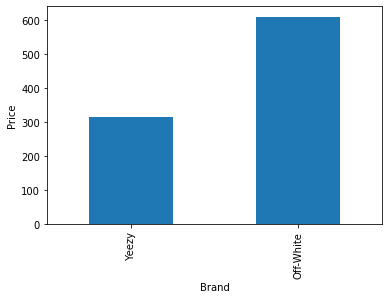

In [137]:
sneakers_df.groupby('Brand')['Sale Price'].median().plot(kind = 'bar', xlabel = 'Brand', ylabel = 'Price');

Is there a relationship between the shoe size of a pair of trainers and its resale value? How could you explain any relationship you can see in the data?

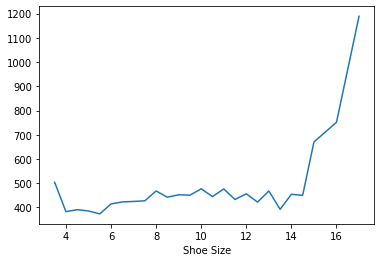

In [132]:
sneakers_df.groupby('Shoe Size')['Sale Price'].mean().plot(kind = 'line');

The client suspects that red sneakers tend to sell for more. Can you test this out and confirm whether it's true or not? 

In [45]:
sneakers_df['is_red'] = sneakers_df['Sneaker Name'].str.lower().str.contains('red')
sneakers_df.groupby('is_red')['Sale Price'].median()

is_red
False    369.0
True     800.0
Name: Sale Price, dtype: float64

Now it's time to build some visualisations! 

Start off by producing histograms **in Plotly** that show the spread of:

* Retail prices
* Sale prices

Are these variables normally distributed? Are there many outliers?

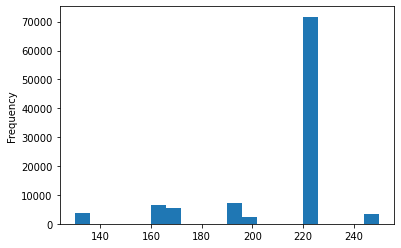

In [131]:
sneakers_df['Retail Price'].plot(kind = 'hist', x= 'Retail Price', bins = 20);

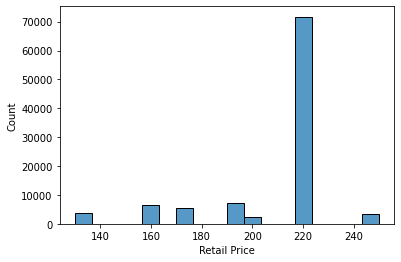

In [130]:
sns.histplot(x = 'Retail Price', data = sneakers_df);

In [ ]:
px.histogram(sneakers_df, x= 'Retail Price')

<AxesSubplot:ylabel='Frequency'>

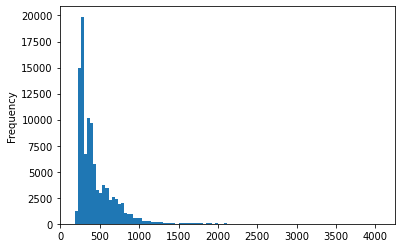

In [49]:
sneakers_df['Sale Price'].plot(kind = 'hist', x= 'Sale Price', bins = 100)

<AxesSubplot:xlabel='Sale Price', ylabel='Count'>

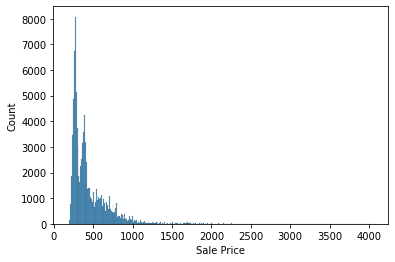

In [50]:
sns.histplot(x = 'Sale Price', data= sneakers_df)

In [51]:
px.histogram(sneakers_df, x= 'Sale Price')

Next, let's make some scatter plots. Also in Plotly, make scatter plots to show the relationship between Sale Price and:

* Shoe Size
* Retail price

Adjust the formatting so that:

* The plots have appropriate titles
* When hovering over a point, the sneaker name and brand are displayed
* The points are coloured according to brand

<AxesSubplot:xlabel='Sale Price', ylabel='Shoe Size'>

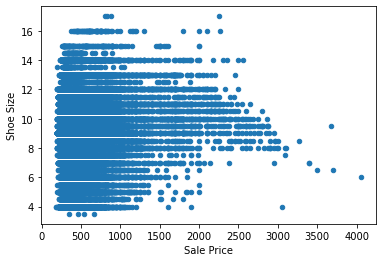

In [52]:
sneakers_df.plot(kind = 'scatter', x = 'Sale Price', y = 'Shoe Size')

<AxesSubplot:xlabel='Sale Price', ylabel='Shoe Size'>

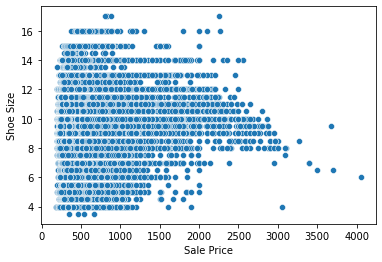

In [53]:
sns.scatterplot(x = 'Sale Price', y = 'Shoe Size', data= sneakers_df)

In [54]:
px.scatter(sneakers_df, x="Shoe Size", y="Sale Price",
                hover_data=['Brand','Sneaker Name'],
                color='Brand')

<AxesSubplot:xlabel='Sale Price', ylabel='Retail Price'>

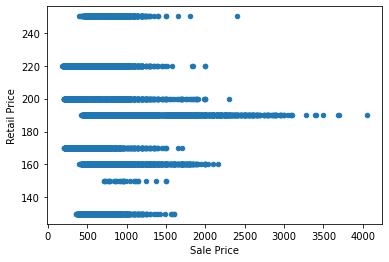

In [55]:
sneakers_df.plot(kind = 'scatter', x = 'Sale Price', y = 'Retail Price')

<AxesSubplot:xlabel='Sale Price', ylabel='Retail Price'>

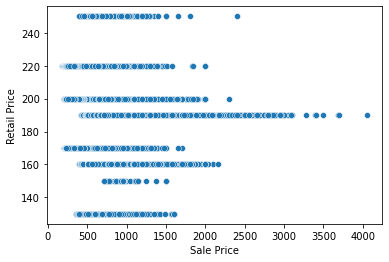

In [56]:
sns.scatterplot(x = 'Sale Price', y = 'Retail Price', data= sneakers_df)

In [57]:
px.scatter(sneakers_df, x="Retail Price", y="Sale Price",
                hover_data=['Brand','Sneaker Name'],
                color='Brand')

Produce a correlation matrix and use it to find the correlation between shoe size and sale price.

In [58]:
sneakers_df.corr()

,Sale Price,Retail Price,Shoe Size,Shoe Size UK,profit,Profit Ratio,is_red
Sale Price,1.000000,-0.361550,0.082795,0.082795,0.996095,0.960253,0.172628
Retail Price,-0.361550,1.000000,-0.052798,-0.052798,-0.442450,-0.588700,0.051279
Shoe Size,0.082795,-0.052798,1.000000,1.000000,0.084637,0.082967,0.020814
Shoe Size UK,0.082795,-0.052798,1.000000,1.000000,0.084637,0.082967,0.020814
profit,0.996095,-0.442450,0.084637,0.084637,1.000000,0.979373,0.161188
Profit Ratio,0.960253,-0.588700,0.082967,0.082967,0.979373,1.000000,0.116742
is_red,0.172628,0.051279,0.020814,0.020814,0.161188,0.116742,1.000000


### Individual EDA

---

Question: what kinds of sneakers generate the most profits?

Brand
Off-White    13677511
 Yeezy       10114129
Name: profit, dtype: int64


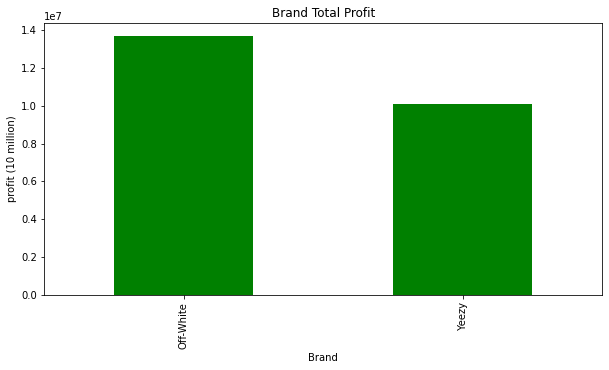

In [125]:
# From the result we can see that Off-White generates more total profit.
BrandProfit = sneakers_df.groupby('Brand')['profit'].sum().sort_values(ascending = False)
print(BrandProfit)
BrandProfit.plot(kind = 'bar', ylabel = 'profit (10 million)', title = 'Brand Total Profit', figsize = (10,5), color = 'Green');


Question: what kinds of buyers generate the most sales? Can you explain why?

Buyer Region
Wyoming           40
Montana           49
South Dakota      55
Alaska            61
North Dakota      64
Vermont           84
Idaho            107
Maine            132
Mississippi      163
West Virginia    166
Name: Sale Price, dtype: int64


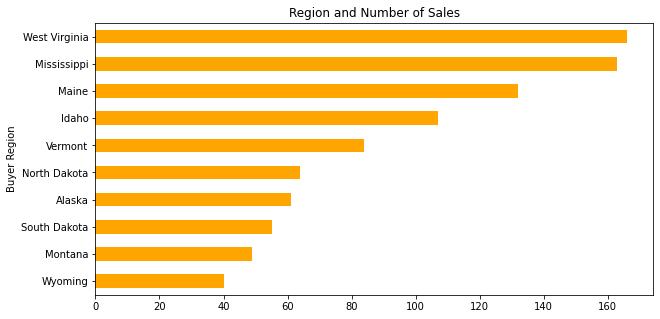

In [126]:
RegionalSalesCount = sneakers_df.groupby('Buyer Region')['Sale Price'].count().sort_values(ascending = True).head(10)
print(RegionalSalesCount)

RegionalSalesCount.plot(kind = 'barh', figsize = (10,5), title = 'Region and Number of Sales', color = 'orange');

Question: which segment of its customer base should StockX target a marketing campaign towards?

In [61]:
# 1. Find out which color generates more profits

## Filter out sneaker names with above mean profits
## Then create a new column 'Sneake Name Refined' without repeating brand names (e.g. Off-Whie)
## Extracting individual words and frequency from the profitable sneaker name list
## The 

terms = {}

sneakers_df['Sneaker Name Refined'] = sneakers_df[
    sneakers_df['Sale Price'] > sneakers_df['Sale Price'].mean()
    ]['Sneaker Name'].str.lower().str.replace('-',' ').str.replace('Off-White', ' ').str.replace('V2', ' ').str.replace('core black',' ')

namelist = (sneakers_df['Sneaker Name Refined'].to_string()).split()
for i in range(len(namelist)):
    term = namelist[i]
    if term in terms:
        terms [term] += 1
    else:
        terms [term] = 1
sorted_terms = dict(sorted(terms.items(), key = lambda x:x[1], reverse= True))
sorted_terms


{'NaN': 66847,
 'white': 26483,
 'off': 22245,
 'air': 18225,
 'nike': 16543,
 '350': 10865,
 'adidas': 10864,
 'yeezy': 10864,
 'boost': 10864,
 'v2': 10409,
 '1': 7098,
 'jordan': 5702,
 'retro': 5702,
 'high': 5702,
 '2018': 5356,
 'black': 5261,
 'blue': 5031,
 'university': 4634,
 'presto': 4361,
 'blazer': 3497,
 'mid': 3497,
 'vapormax': 3424,
 'max': 3343,
 'low': 2348,
 'zebra': 2251,
 '90': 1959,
 'static': 1750,
 'reflective': 1727,
 'beluga': 1716,
 'all': 1431,
 'hallows': 1431,
 'eve': 1431,
 'force': 1395,
 '97': 1386,
 'semi': 1365,
 'frozen': 1365,
 'yellow': 1365,
 'grim': 1282,
 'reaper': 1282,
 'red': 1271,
 '2pt0': 1218,
 '2017': 1213,
 'chicago': 755,
 'desert': 620,
 'ore': 620,
 'cream': 588,
 'tint': 397,
 'menta': 343,
 'wolf': 288,
 'grey': 288,
 'zoom': 280,
 'fly': 280,
 'react': 243,
 'hyperdunk': 243,
 'flyknit': 243,
 'copper': 225,
 'pirate': 217,
 'elemental': 216,
 'rose': 216,
 'queen': 216,
 'green': 196,
 '2016': 123,
 'moonrock': 100,
 '2015': 96,

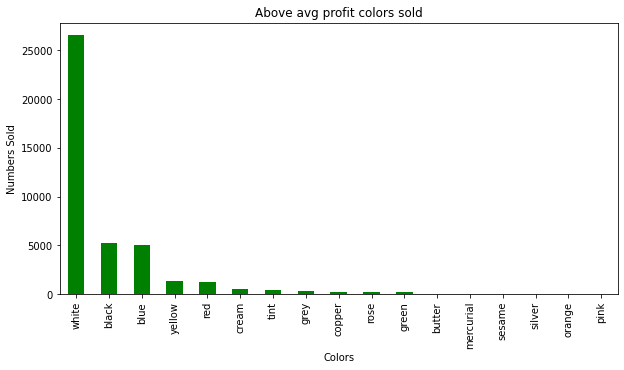

In [127]:
# From the list, we can extract a dictionary of colors and their frequencies(for items sold above avg profit):

top_colors_sold = {}

colorlist = ['white', 'black', 'blue', 'yellow', 'red', 'cream', 'tint', 'grey', 'copper', 'rose', 'green', 'butter', 'mercurial', 'sesame', 'silver', 'orange', 'pink']
for color in colorlist:
    top_colors_sold[color] = sorted_terms[color]

Series_top_colors = pd.Series(top_colors_sold)
Series_top_colors.plot(kind = 'bar', xlabel = 'Colors', ylabel = 'Numbers Sold', title = 'Above avg profit colors sold',figsize = (10,5), color = 'green');

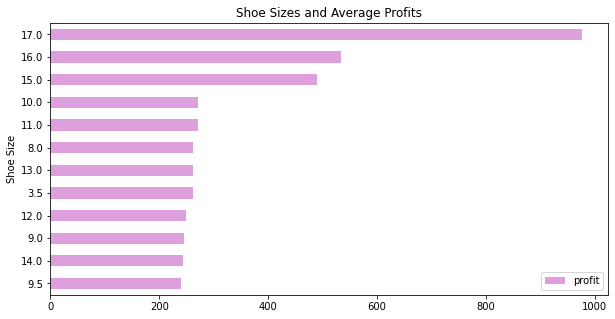

In [129]:
# 2. Find out which size generates more profit

sizes_profits = pd.DataFrame(sneakers_df.groupby('Shoe Size')['profit'].mean())
sizes_profits[sizes_profits.profit > sneakers_df['profit'].mean()].sort_values(by = 'profit').plot(kind = 'barh', ylabel = 'Avg.profit', title = 'Shoe Sizes and Average Profits', figsize = (10,5), color = 'plum');

---

<a id="covid"></a>

# <font color='blue'> Covid API

In this section, we're requesting and analysing data from this API: https://covid19api.com/ 

Take a few moments to read through some of the information on this site and figure out:

* Where this API gets its data from (and whether it's a reputable source)
* How we can access the documentation that tells us how the API works
* Whether the API is free
    
The documentation is available here: https://documenter.getpostman.com/view/10808728/SzS8rjbc
    
Remember, the documentation tells us:

* What sort of data is available
* Whether it’s free to access 
* How we can build a URL to get the exact data we want

Spend some time exploring the documentation and familiarising yourself with it, and then let's get started!

Let's start by importing the **requests** library, which we'll be using to make API requests.

In [64]:
import requests
from pprint import pprint as pp

First, visit this API endpoint in your web browser:

https://api.covid19api.com/summary

Read the documentation and visually inspect the JSON in your browser window to understand what the data is showing you, and how it's structured.

Now, make a request to the same URL in this notebook using Python, and view the resulting JSON.

Store the JSON as a variable called `covid_json`

In [65]:
covid_json = requests.get('https://api.covid19api.com/summary').json()

In [66]:
pp(covid_json)

{'Countries': [{'Country': 'Afghanistan',
                'CountryCode': 'AF',
                'Date': '2022-08-01T07:01:44.19Z',
                'ID': '33e63aa7-12e9-4251-8a74-e87df3efa82c',
                'NewConfirmed': 0,
                'NewDeaths': 0,
                'NewRecovered': 0,
                'Premium': {},
                'Slug': 'afghanistan',
                'TotalConfirmed': 185749,
                'TotalDeaths': 7748,
                'TotalRecovered': 0},
               {'Country': 'Albania',
                'CountryCode': 'AL',
                'Date': '2022-08-01T07:01:44.19Z',
                'ID': 'df98bcae-258b-41ac-9f40-504ed544b0dd',
                'NewConfirmed': 0,
                'NewDeaths': 0,
                'NewRecovered': 0,
                'Premium': {},
                'Slug': 'albania',
                'TotalConfirmed': 312097,
                'TotalDeaths': 3545,
                'TotalRecovered': 0},
               {'Country': 'Algeria',
        

Now, use your dictionary and list-indexing skills to access the **total** number of new confirmed cases.

In [67]:
covid_json['Global']['NewConfirmed']

352135

Now, can you figure out which endpoint/URL you need to get daily coronavirus figures for Germany only, without having to specify a time or date range?

View the URL you think is the correct one in your web browser, to verify that it's giving you the right data.

Store the resulting data in a variable called `germany_json`

In [68]:
germany_json = requests.get('https://api.covid19api.com/total/country/germany').json()

In [69]:
pp(germany_json)

[{'Active': 0,
  'City': '',
  'CityCode': '',
  'Confirmed': 0,
  'Country': 'Germany',
  'CountryCode': '',
  'Date': '2020-01-22T00:00:00Z',
  'Deaths': 0,
  'Lat': '0',
  'Lon': '0',
  'Province': '',
  'Recovered': 0},
 {'Active': 0,
  'City': '',
  'CityCode': '',
  'Confirmed': 0,
  'Country': 'Germany',
  'CountryCode': '',
  'Date': '2020-01-23T00:00:00Z',
  'Deaths': 0,
  'Lat': '0',
  'Lon': '0',
  'Province': '',
  'Recovered': 0},
 {'Active': 0,
  'City': '',
  'CityCode': '',
  'Confirmed': 0,
  'Country': 'Germany',
  'CountryCode': '',
  'Date': '2020-01-24T00:00:00Z',
  'Deaths': 0,
  'Lat': '0',
  'Lon': '0',
  'Province': '',
  'Recovered': 0},
 {'Active': 0,
  'City': '',
  'CityCode': '',
  'Confirmed': 0,
  'Country': 'Germany',
  'CountryCode': '',
  'Date': '2020-01-25T00:00:00Z',
  'Deaths': 0,
  'Lat': '0',
  'Lon': '0',
  'Province': '',
  'Recovered': 0},
 {'Active': 0,
  'City': '',
  'CityCode': '',
  'Confirmed': 0,
  'Country': 'Germany',
  'CountryCode'

Working with JSON and dictionaries is great because it's very standardised, but it's not a very pretty data format to work with. 

Convert the Germany JSON into a Pandas `DataFrame`.

In [70]:
import pandas as pd

In [71]:
germany_data = pd.DataFrame(germany_json)
germany_data.head()

,Country,CountryCode,Province,City,CityCode,Lat,Lon,Confirmed,Deaths,Recovered,Active,Date
0,Germany,,,,,0,0,0,0,0,0,2020-01-22T00:00:00Z
1,Germany,,,,,0,0,0,0,0,0,2020-01-23T00:00:00Z
2,Germany,,,,,0,0,0,0,0,0,2020-01-24T00:00:00Z
3,Germany,,,,,0,0,0,0,0,0,2020-01-25T00:00:00Z
4,Germany,,,,,0,0,0,0,0,0,2020-01-26T00:00:00Z


We know how to make an API request to get covid data for a single country, using the API at https://covid19api.com/. We use this URL and change the name of the country:

`https://api.covid19api.com/total/country/germany`

What if we wanted to make several API requests for multiple countries? We could do it the long way round...Or we could use a `for` loop! Let's do this now.

First, write a `for` loop that will make an API request for covid data for each of the following countries in turn: (**hint: you'll need to perform some string concatenation**)

* Switzerland
* Austria
* Brazil
* Turkey
* Germany

On each iteration of the loop, your code should print out a message like this:

```The total number of confirmed cases in [country name] as of [latest date] is [number of cases]```

In [72]:
countryList = ['Switzerland', 'Austria','Brazil','Turkey','Germany']

for i in countryList:
    countryData = requests.get(f'https://api.covid19api.com/total/country/{i}').json()
    latestDate = countryData[-1]['Date'][0:10]
    latestCases = countryData[-1]['Confirmed']
    print(f'The total number of confirmed cases in {i} as of {latestDate} is {latestCases}.')

The total number of confirmed cases in Switzerland as of 2022-07-31 is 3949259.
The total number of confirmed cases in Austria as of 2022-07-31 is 4774043.
The total number of confirmed cases in Brazil as of 2022-07-31 is 33833900.
The total number of confirmed cases in Turkey as of 2022-07-31 is 15889495.
The total number of confirmed cases in Germany as of 2022-07-31 is 30854175.


Now let's try to incorporate an `if` statement into our API request. Can you write an API request combined with an `if` statement, to do the following:

* Get the total number of coronavirus cases in Switzerland
* If the number of cases is greater than 500,000 print the message "Over half a million cases in Switzerland"
* Otherwise, print the message "Under half a million cases in Switzerland"

In [73]:
swizerlandJson = requests.get(f'https://api.covid19api.com/total/country/switzerland').json()
if swizerlandJson[-1]['Confirmed'] > 500000:
    print('Over half a million cases in Switzerland')
else:
    print('Under half a million cases in Switzerland')


Over half a million cases in Switzerland


Now, get the number of total coronavirus cases in Switzerland and France. 

If the total number of cases in France is higher, print the message "France has had more covid cases than Switzerland" otherwise print "Switzerland has had more covid cases than France"


In [74]:
swizerlandJson = requests.get(f'https://api.covid19api.com/total/country/switzerland').json()
swizerlandCases = swizerlandJson[-1]['Confirmed']

franceJson = requests.get(f'https://api.covid19api.com/total/country/france').json()
franceCases = franceJson[-1]['Confirmed']

if franceCases > swizerlandCases:
    print('France has had more covid cases than Swizerland')
else:
    print('Switzerland has had more covid cases than France')

France has had more covid cases than Swizerland


### Individual EDA

Re-visit the API to decide what data you would like to extract, for example number of new cases per day (note: some data will not be available for free)

In [140]:
# I am interested in comparing Australia, China, Germany, U.S. and Japan's overal fatality rates.


# Global variable: define the countries under examination: can add new to the list. 
countryList = ['Australia', 'China', 'united-states','Germany','Japan']

# Extract key information from API
OutputList = []
for i in countryList:
    countryData = requests.get(f'https://api.covid19api.com/total/country/{i}').json()[-1]
    Date = countryData['Date'][0:10]
    ConfirmedCases = countryData['Confirmed']
    Deaths = countryData['Deaths']
    d = {'country':i, 'date':Date, 'Total Confirmed': ConfirmedCases, 'Total Deaths': Deaths}
    OutputList.append(d)

# Consolidate into a DataFrame
OutputDf = pd.DataFrame(OutputList)
OutputDf['Fatality Rate'] = round(OutputDf['Total Deaths'] / OutputDf['Total Confirmed'],3)
OutputDf

,country,date,Total Confirmed,Total Deaths,Fatality Rate
0,Australia,2022-07-31,9435839,11865,0.001
1,China,2022-07-31,1584379,14735,0.009
2,united-states,2022-07-31,91316648,1029926,0.011
3,Germany,2022-07-31,30854175,143979,0.005
4,Japan,2022-07-31,12779171,32609,0.003


In [ ]:
px.bar(OutputDf[['country', 'Fatality Rate']]
    .sort_values(by = 'Fatality Rate'), 
    x='country', 
    y='Fatality Rate',
    hover_data=['country','Fatality Rate'],
                color='country')

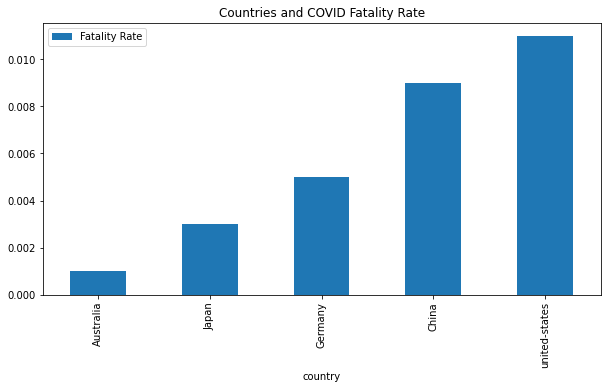

In [ ]:
# Graph the dataframe

OutputDf[['country', 'Fatality Rate']].sort_values(by = 'Fatality Rate').plot(kind = 'bar', x = 'country', figsize = (10,5), title = 'Countries and COVID Fatality Rate');

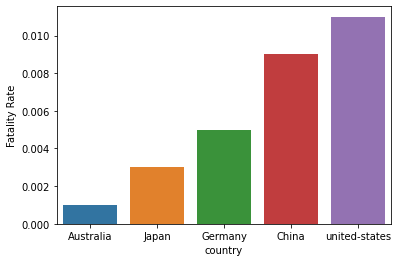

In [143]:
sns.barplot(x = 'country', y = 'Fatality Rate', data= OutputDf[['country', 'Fatality Rate']].sort_values(by = 'Fatality Rate'));